In [3]:
import open_clip 
from open_clip import create_model_and_transforms, get_tokenizer
import textwrap
import os
import torch
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from collections import OrderedDict
import pandas as pd
from pathlib import Path
import pandas as pd
from torch import nn
from os.path import exists
from urllib.parse import urlparse
import numpy as np
from sklearn.metrics import roc_curve                
from sklearn.metrics import precision_recall_curve  
from sklearn.metrics import f1_score               
from sklearn.metrics import fbeta_score
from pathlib import Path
from typing import Tuple, Union
from matplotlib import colors
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from PIL import Image
import multiprocessing # CPU parallelization
from multiprocessing import Pool
from multiprocessing import Lock
lock = Lock()
from torch.nn.parallel import DistributedDataParallel as DDP   # GPU parallelization
import tarfile 
from io import BytesIO
import time
import spacy
import scispacy
nlp = spacy.load('en_core_web_sm')
biomednlp = spacy.load("en_core_sci_lg")

import os
import shutil
import glob
import argparse
import scipy.stats as stats


#custom modules
#from training.saliency import plot_saliency_map,sliding_window_largestride, get_random_crop_params,get_random_crop_params_fixedcropsize,sliding_window,get_cropped_image,update_saliency_map,cosine_similarity

start_time = time.time()

# replace PATH to the model with yours
model, preprocess_train, preprocess_val = create_model_and_transforms("hf-hub_microsoft_pretrained_laion_large", pretrained='/p/project/medvl/models/newest_caption_title_umls_sentence_umls.pt') 
tokenizer = open_clip.get_tokenizer("hf-hub_microsoft_pretrained_laion_large")
val_data = "/p/scratch/medvl/data/val/val_00000.tar"
base_path = '/p/project/medvl/users/tahir/bestmodel/val_data'
precision = "amp"
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)
model.eval()

print("TEST COMPLETE")

/p/project/medvl/users/tahir/ExplainSegmentVLM/openclip_install/.explainsegmentVLM_env/lib/python3.8/site-packages/torch/cuda/__init__.py:611: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
/p/project/medvl/users/tahir/ExplainSegmentVLM/openclip_install/.explainsegmentVLM_env/lib/python3.8/site-packages/spacy/language.py:2141: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]
/p/project/medvl/users/tahir/ExplainSegmentVLM/openclip_install/.explainsegmentVLM_env/lib/python3.8/site-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name vit_large_patch14_224_clip_laion2b to current vit_large_patch14_clip_224.laion2b.
  model = create_fn(
Some weights of the model checkpoint at microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions

TEST COMPLETE


The list of all suggested keywords is:

 ['positive', 'Anti-Ki', 'antibody', 'Ki-67 monoclonal antibody', 'G2 Endocrine tumor', 'tumor', 'patient', 'tumor cell', 'nucleus stains', 'monoclonal', 'cell']


/tmp/ipykernel_5787/1586605862.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(8, 12))


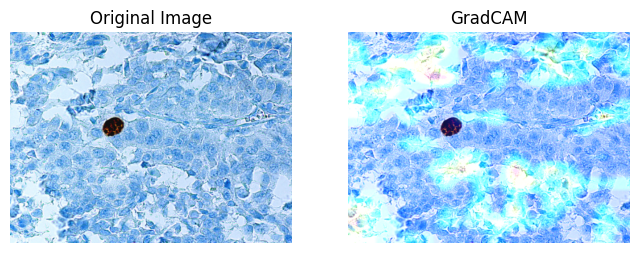

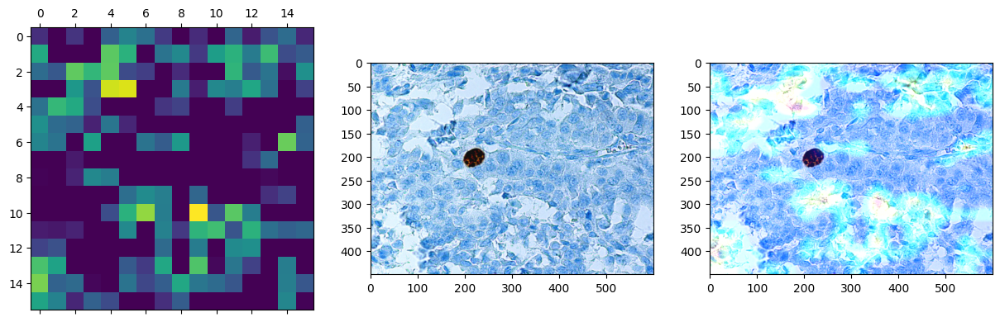

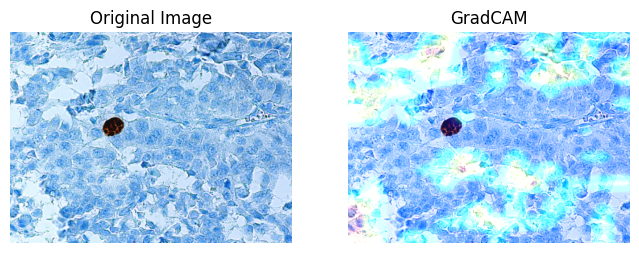

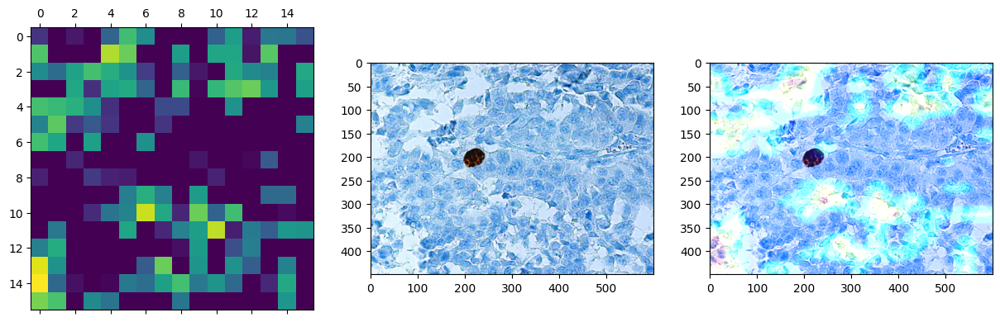

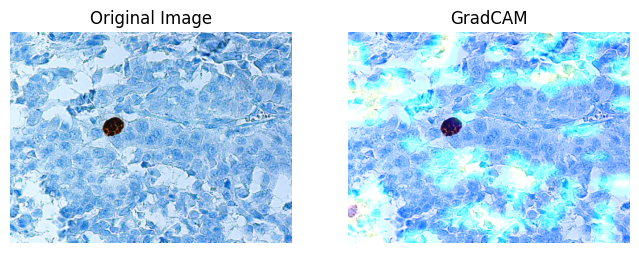

...

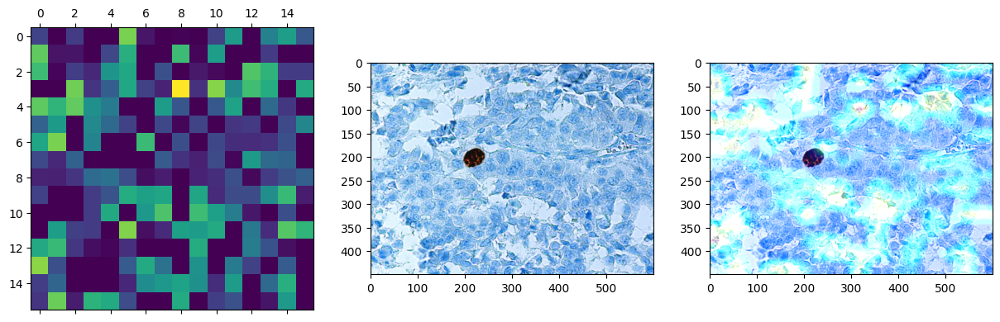

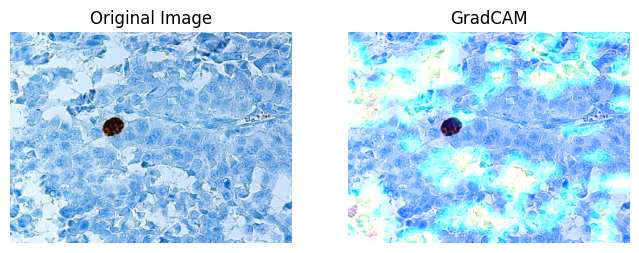

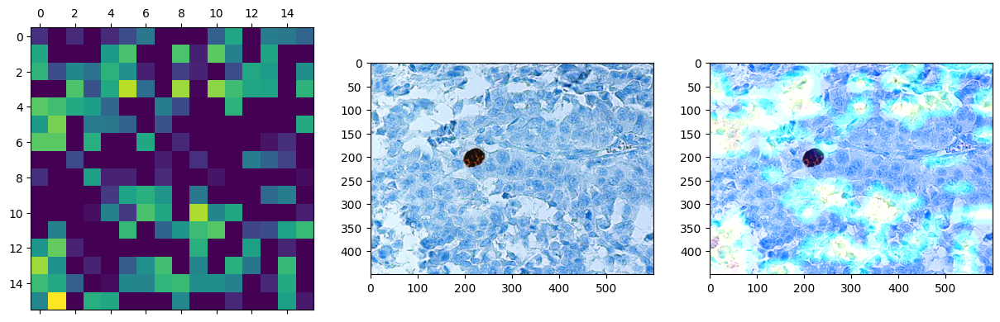

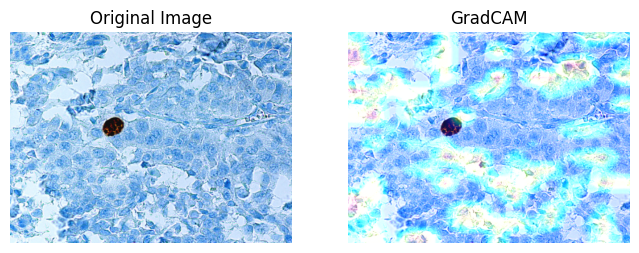

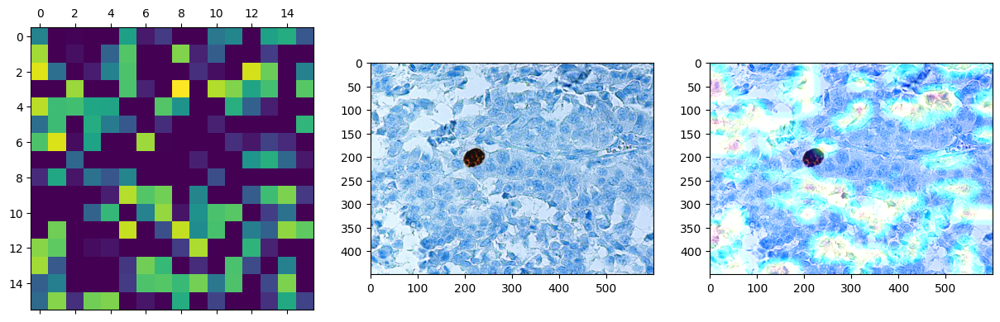

In [5]:
# GRADCAM libraries

import gc 
import open_clip 
import torch
from PIL import Image

from gradcam.heatmap import get_heatmaps
from gradcam.utils import (
    create_grid,
    get_all_layers,
    get_images,
    show_attention_map,
)

from gradcam.gradcam import grad_cam,get_layer,get_layer_modif
import cv2


start_time = time.time()

filename = "PMC1971253_4789321"
crop_size = 75
stride_sizes = 16
num_crops = 500

def img_query_extract(filename):

     # preparing the img-query couple
     jpg = base_path + f"/{filename}.jpg"
     txt = base_path + f"/{filename}.txt"

     raw_image  = Image.open(jpg) 
     with open(txt, 'r') as text_file: 
          query = str(text_file.read()) 

     new_file_dir = f'/p/project/medvl/users/tahir/ExplainSegmentVLM/saliencies/{filename}/'

     if not os.path.exists(new_file_dir):
          os.mkdir(new_file_dir)                          
      
     width, height = raw_image.size
     #print(f'The resolution of {filename} is {width} x {height} pixels')

     return raw_image, query


def saliency_generator(filename,raw_image,query,crop_size,stride_sizes=None,num_crops=None):

     #processing the image
     img_np_tensor = np.array(raw_image)   
     x_dim, y_dim = raw_image.size     
     img_pt_tensor = preprocess_val(raw_image)
     img_pt_tensor = img_pt_tensor.to(device=device, non_blocking=True) #img_pt_tensor = img_pt_tensor.to(device=device, dtype=input_dtype, non_blocking=True)
     img_pt_tensor = img_pt_tensor.unsqueeze(0).to(device=device)

     # extracting all keywords from the query 
     all_keywords = []
     #all_keywords.append(query)
     biomeddoc = biomednlp(query)
     biomed_terms = [ent.text for ent in biomeddoc.ents]
     doc = nlp(query)
     temp = list(doc.noun_chunks)
     noun_chunks = [chunk.text for chunk in temp]
     articles = ["a", "an", "the"]
     for i in range(len(noun_chunks)):
          chunk_words = noun_chunks[i].split()
          if chunk_words[0].lower() in articles:
                noun_chunks[i] = " ".join(chunk_words[1:])

     standalone_nouns = [token.text for token in doc if token.pos_ in ('NOUN')]
     all_keywords = biomed_terms + standalone_nouns
     all_keywords = list(set(all_keywords)) # no repeated keywords

     all_tokens = [tokenizer(keyword).to(device=device) for keyword in all_keywords]
     keywords_tokens = dict(zip(all_keywords, all_tokens))
     print("The list of all suggested keywords is:\n\n", all_keywords, flush=True)



     for keyword in all_keywords:

          # Preparing a 1x2 subplot of saliency maps 
          fig, axs = plt.subplots(1, 2, figsize=(8, 12))

          axs[0].imshow(raw_image)
          axs[0].axis("off")
          axs[0].set_title('Original Image')

          #GradCAM
          # modelname = "hf-hub_microsoft_pretrained_laion_large"
          # pretrain_tag= '/p/project/medvl/models/newest_caption_title_umls_sentence_umls.pt'
          img_path = base_path + f"/{filename}.jpg"
          # file = open(f"/p/project/medvl/users/tahir/ExplainVLM/saliencies/{filename}/" + "temp.txt", "w")
          # file.write(keyword)
          # file.close()

          savepath= f"/p/project/medvl/users/tahir/ExplainSegmentVLM/saliencies/{filename}/"
          #txt_path = savepath + "temp.txt"

          sal1 = grad_cam(model,preprocess_val,tokenizer,img_path,keyword)
          result_img = show_attention_map(sal1,img_path,savepath,keyword,filename) # separately save the GradCAM full results
          axs[1].imshow((result_img / 255)[..., ::-1])
          axs[1].axis("off")
          axs[1].set_title('GradCAM')



# running MAIN 

raw_image , query = img_query_extract(filename)
saliency_generator(filename,raw_image,query,crop_size,stride_sizes=stride_sizes,num_crops = num_crops)
